# Explore the data


## General initial steps

In [1]:
import os

processing1_folder_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..', 'data', 'processed', 'processing2'))
file_names = os.listdir(processing1_folder_path)
file_paths = [os.path.join(processing1_folder_path, file) for file in file_names]

file_paths


['/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Drake.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Alligatoah.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/BRKN.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/RIN.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/John Lennon.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Udo Lindenberg.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Kraftklub.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Ed Sheeran.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Linkin Park.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Leoniden.json',
 '/Users/joba/Documents/GitHub/lyrics-analysis/data/processed/processing2/Von Wegen Lisbeth.jso

## General information about the data

### Artist

Number of artists: 14
Number of songs for Drake: 100
Number of songs for Alligatoah: 100
Number of songs for BRKN: 58
Number of songs for RIN: 87
Number of songs for John Lennon: 100
Number of songs for Udo Lindenberg: 100
Number of songs for Kraftklub: 66
Number of songs for Ed Sheeran: 100
Number of songs for Linkin Park: 100
Number of songs for Leoniden: 41
Number of songs for Von Wegen Lisbeth: 53
Number of songs for Green Day: 100
Number of songs for Wolfgang Petry: 100
Number of songs for Nena: 100
Number of all songs: 1205


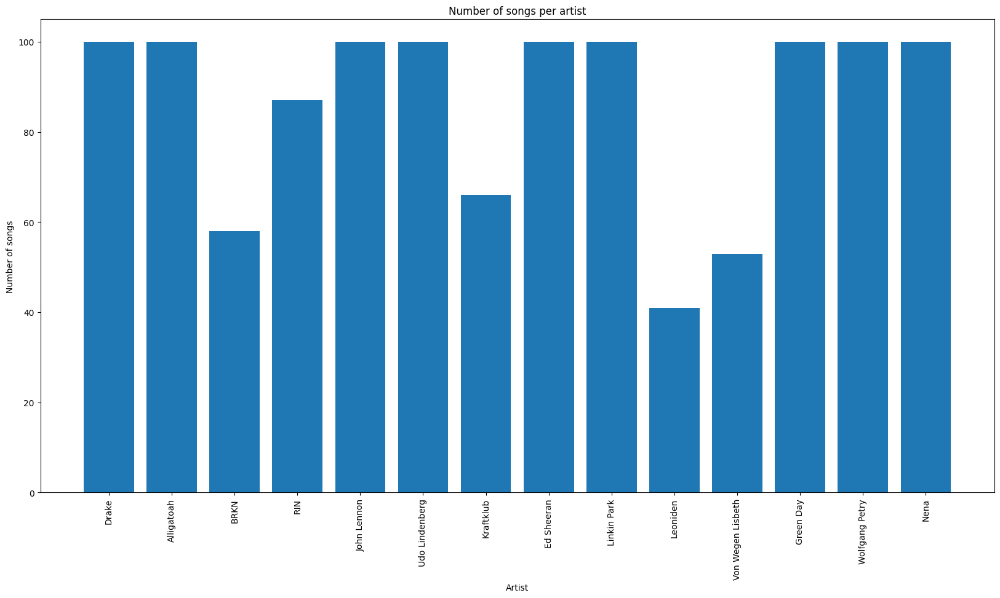

In [2]:
import json

# Artist count and names
artist_count = len(file_names)
artist_names = [file_name.split('.')[0] for file_name in file_names]
print(f'Number of artists: {artist_count}')

song_count = 0
# Number of songs per artist
for file_path in file_paths:
    with open(file_path, 'r') as file:
        artist = json.load(file)
        print(f'Number of songs for {artist[0]["artist"]}: {len(artist)}')
        song_count += len(artist)

print(f'Number of all songs: {song_count}')

# Draw bar chart for number of songs per artist
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plt.bar(artist_names, [len(json.load(open(file_path, 'r'))) for file_path in file_paths])
plt.xticks(rotation=90)
plt.xlabel('Artist')
plt.ylabel('Number of songs')
plt.title('Number of songs per artist')
plt.show()


### Lyrics


Length of lyrics for Drake: 283385
Length of lyrics for Alligatoah: 281497
Length of lyrics for BRKN: 113169
Length of lyrics for RIN: 163091
Length of lyrics for John Lennon: 92507
Length of lyrics for Udo Lindenberg: 130260
Length of lyrics for Kraftklub: 128126
Length of lyrics for Ed Sheeran: 196160
Length of lyrics for Linkin Park: 161506
Length of lyrics for Leoniden: 49374
Length of lyrics for Von Wegen Lisbeth: 55968
Length of lyrics for Green Day: 120687
Length of lyrics for Wolfgang Petry: 101489
Length of lyrics for Nena: 91447
Length of all lyrics: 1968666


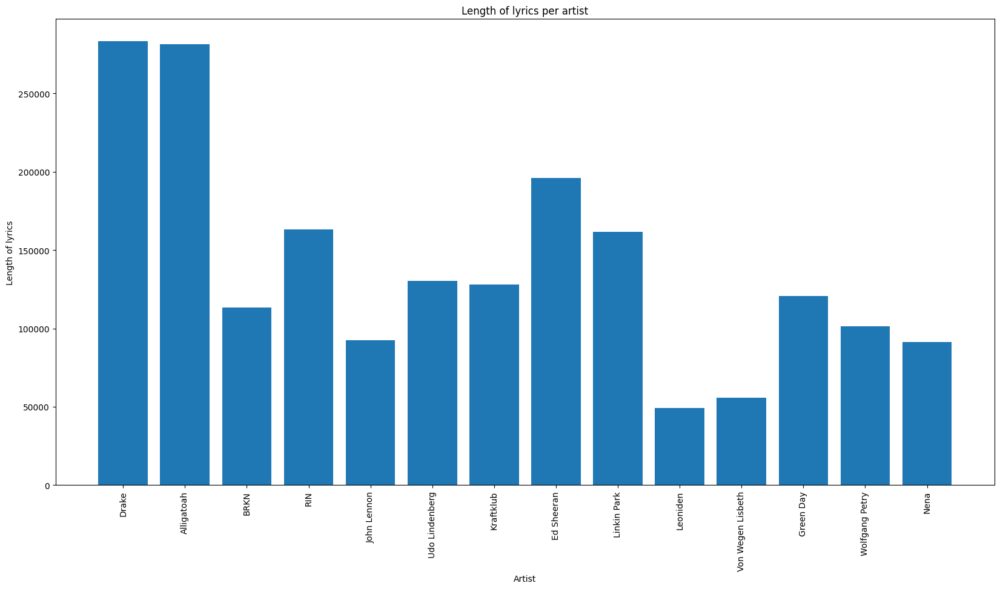

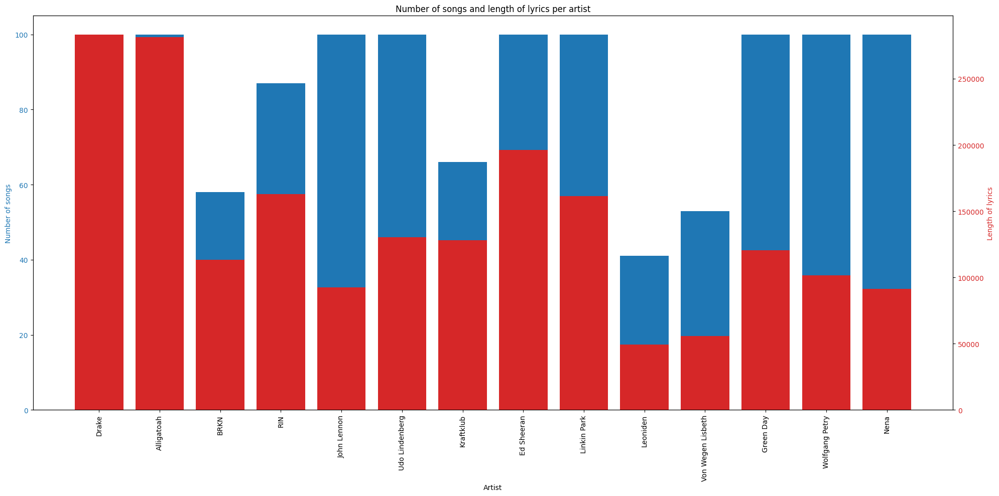

In [3]:
# Length of lyrics per artist
all_lyrics_length = 0
lyrics_length_per_artist = []
for file_path in file_paths:
    with open(file_path, 'r') as file:
        artist = json.load(file)
        # length of all lyrics
        lyrics_length = 0
        for song in artist:
            lyrics_length += len(song['lyrics'])

        print(f'Length of lyrics for {artist[0]["artist"]}: {lyrics_length}')
        all_lyrics_length += lyrics_length
        lyrics_length_per_artist.append(lyrics_length)

print(f'Length of all lyrics: {all_lyrics_length}')

# Bar chart for length of lyrics per artist
plt.figure(figsize=(20, 10))
plt.bar(artist_names, lyrics_length_per_artist)
plt.xticks(rotation=90)
plt.xlabel('Artist')
plt.ylabel('Length of lyrics')
plt.title('Length of lyrics per artist')
plt.show()

# Display number of songs and length of lyrics per artist in one chart
fig, ax1 = plt.subplots(figsize=(20, 10))
ax1.bar(artist_names, [len(json.load(open(file_path, 'r'))) for file_path in file_paths], color='tab:blue')
ax1.set_xlabel('Artist')
ax1.set_ylabel('Number of songs', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.tick_params(axis='x', rotation=90)
ax2 = ax1.twinx()
ax2.bar(artist_names, lyrics_length_per_artist, color='tab:red')
ax2.set_ylabel('Length of lyrics', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
plt.title('Number of songs and length of lyrics per artist')
fig.tight_layout()
plt.show()






[nltk_data] Downloading package stopwords to /Users/joba/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


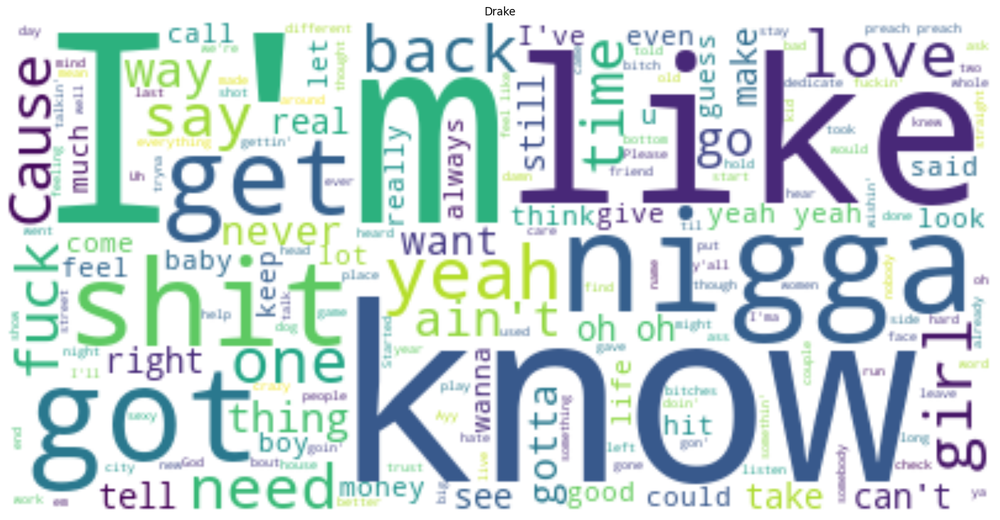

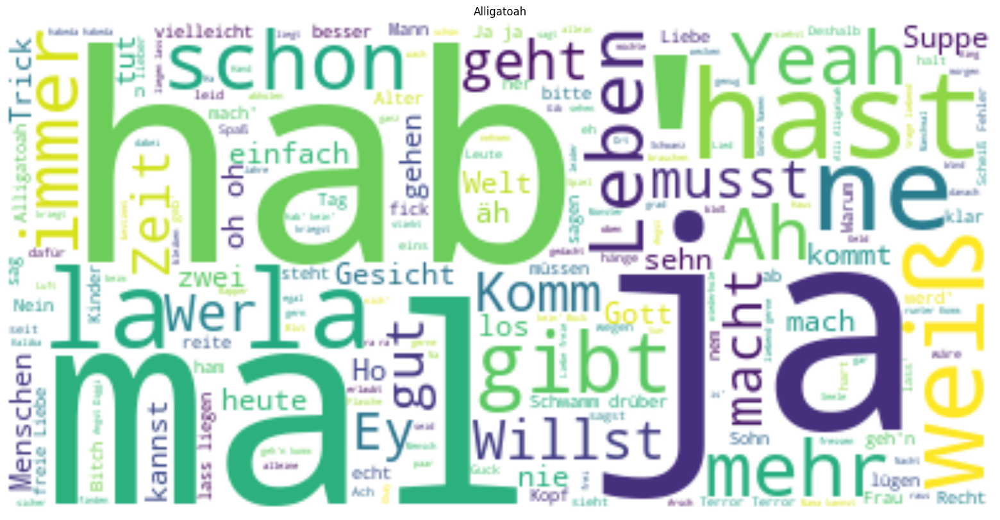

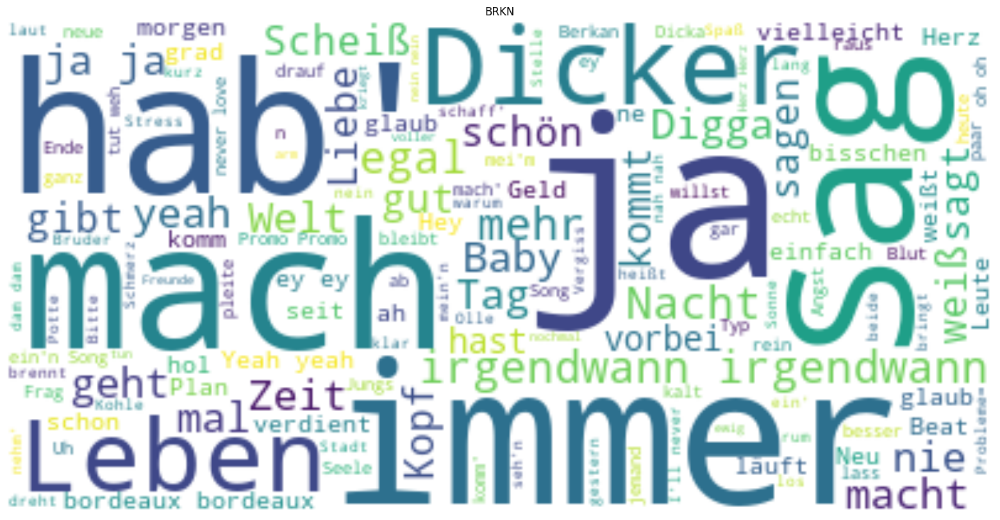

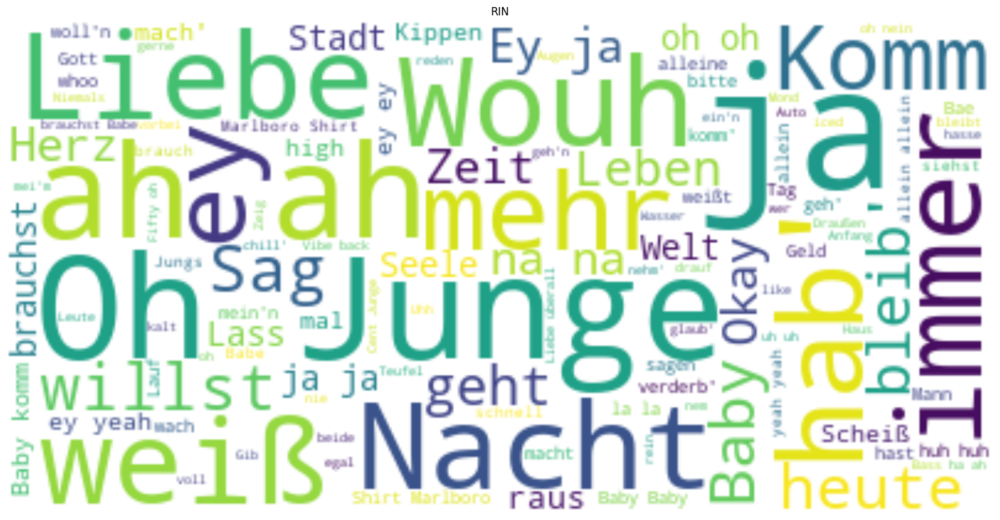

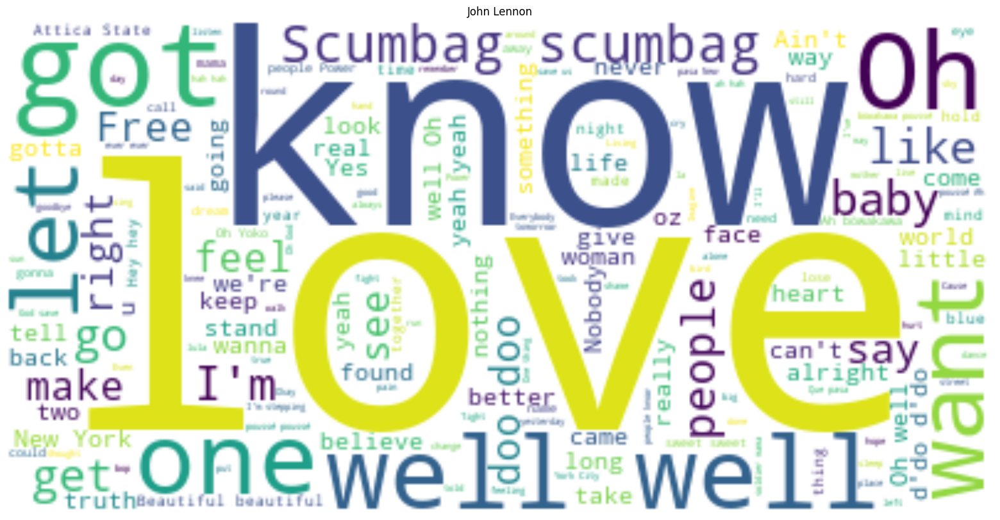

...

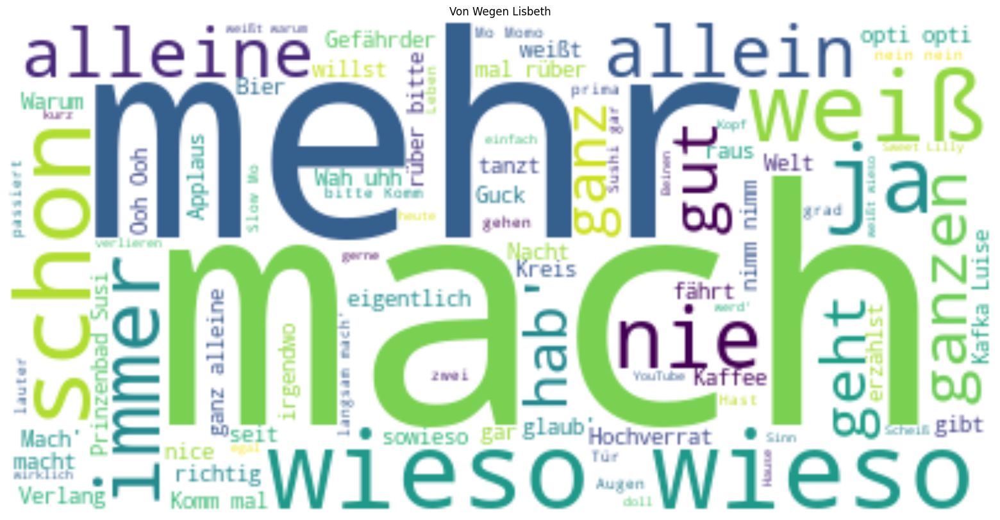

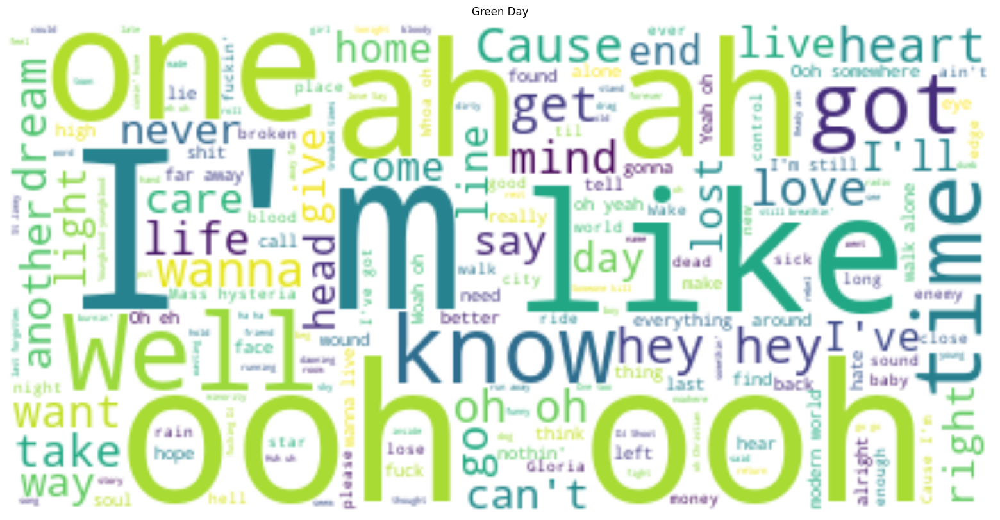

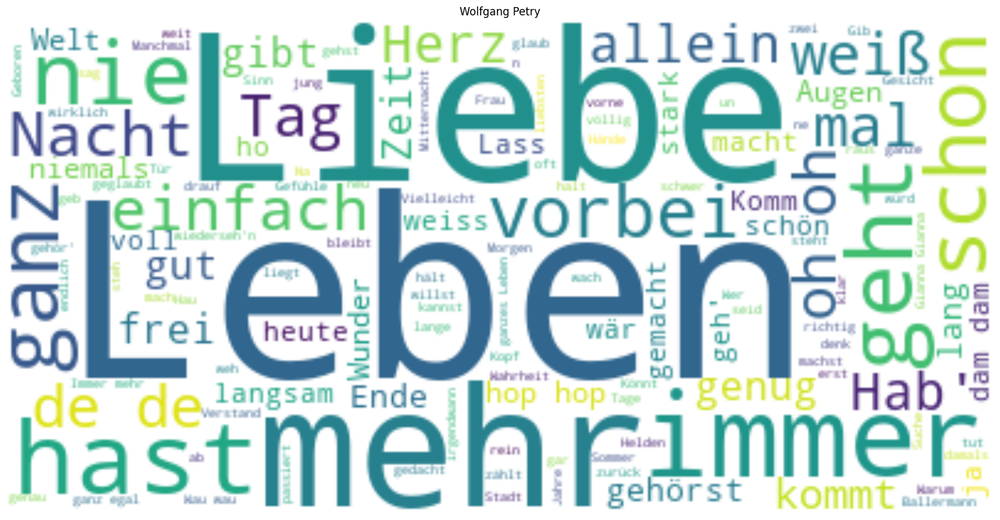

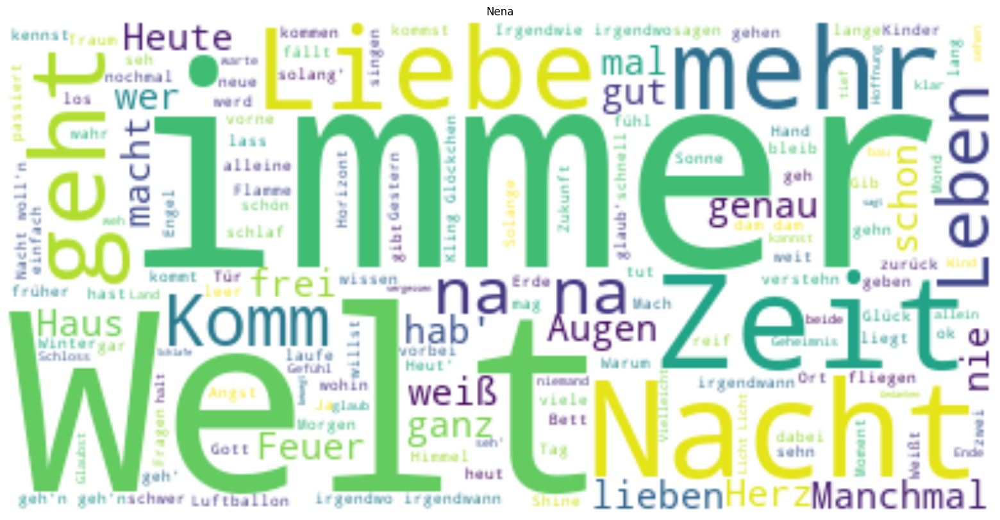

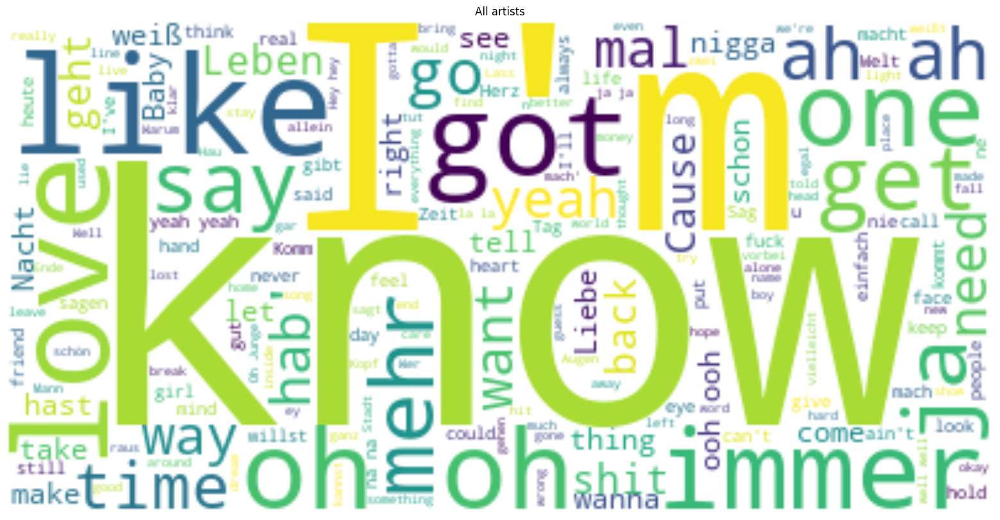

In [4]:
# Most used words in lyrics per artist as word cloud, without german and english stop words
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

# download stopwords
nltk.download('stopwords')
stop_words = stopwords.words('english') + stopwords.words('german')

# Create word cloud for each artist
for file_path in file_paths:
    with open(file_path, 'r') as file:
        artist = json.load(file)
        lyrics = ''
        for song in artist:
            lyrics += song['lyrics'] + ' '

        wordcloud = WordCloud(stopwords=stop_words, background_color='white').generate(lyrics)
        plt.figure(figsize=(20, 10))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(artist[0]['artist'])
        plt.show()

# Create word cloud for all artists
all_lyrics = ''
for file_path in file_paths:
    with open(file_path, 'r') as file:
        artist = json.load(file)
        for song in artist:
            all_lyrics += song['lyrics'] + ' '

wordcloud = WordCloud(stopwords=stop_words, background_color='white').generate(all_lyrics)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('All artists')
plt.show()


### Sentiment

In [ ]:
# AWS Comprehend Cost for sentiment analysis of all songs
(all_lyrics_length / 100) * 0.001


In [ ]:
# Length of lyrics per artist limited to first 100 songs
all_lyrics_length = 0
for file_path in file_paths:
    with open(file_path, 'r') as file:
        artist = json.load(file)
        # length of all lyrics
        lyrics_length = 0
        for song in artist[:100]:
            lyrics_length += len(song['lyrics'])

        print(f'Length of lyrics for {artist[0]["artist"]}: {lyrics_length}')
        all_lyrics_length += lyrics_length

print(f'Length of all lyrics: {all_lyrics_length}')


In [ ]:
# AWS Comprehend Cost for sentiment analysis of first 100 songs
(all_lyrics_length / 100) * 0.001


### Languages
In which languages are the lyrics?